In [1]:
from vivarium import InteractiveContext, Artifact

from datetime import datetime, timedelta
from pathlib import Path
import itertools
import matplotlib.pyplot as plt
import ipywidgets
import pandas as pd, numpy as np
pd.set_option('display.max_rows', 60)

import numpy as np
import researchpy as rp
import statsmodels.api as sm
import statsmodels.formula.api as smf
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns

from db_queries import get_outputs as go
from db_queries import get_ids
from get_draws.api import get_draws

## Load in Data and First Time Step

In [2]:
path = Path('/ihme/homes/lutzes/vivarium_nih_us_cvd/src/vivarium_nih_us_cvd/model_specifications/nih_us_cvd.yaml')
path

PosixPath('/ihme/homes/lutzes/vivarium_nih_us_cvd/src/vivarium_nih_us_cvd/model_specifications/nih_us_cvd.yaml')

In [3]:
sim = InteractiveContext(Path(path), setup=False)
sim.configuration.update({
                          'population':
                              {'population_size': 50_000,
                              },
                          'time':
                              {'start':
                                  {'year': 2021
                                  }
                              }
                          }
                        )
sim.setup()

2023-06-16 09:02:56.419 | INFO     | simulation_1-artifact_manager:66 - Running simulation from artifact located at /mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/alabama.hdf.
2023-06-16 09:02:56.421 | INFO     | simulation_1-artifact_manager:67 - Artifact base filter terms are ['draw == 0'].
2023-06-16 09:02:56.426 | INFO     | simulation_1-artifact_manager:68 - Artifact additional filter terms are None.


/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:78: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:223: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning

In [4]:
pop0 = sim.get_population()
pop0.head()

,tracked,entrance_time,exit_time,age,alive,location,sex,cause_of_death,years_of_life_lost,years_lived_with_disability,...,post_myocardial_infarction_event_time,post_myocardial_infarction_event_count,transient_post_myocardial_infarction_event_count,transient_post_myocardial_infarction_event_time,heart_failure_from_ischemic_heart_disease_event_time,heart_failure_from_ischemic_heart_disease_event_count,acute_myocardial_infarction_and_heart_failure_event_count,acute_myocardial_infarction_and_heart_failure_event_time,heart_failure_residual_event_time,heart_failure_residual_event_count
0,True,2020-12-04,NaT,47.388882,alive,Alabama,Female,not_dead,0.0,0.0,...,NaT,0,0,NaT,NaT,0,0,NaT,NaT,0
1,True,2020-12-04,NaT,41.564194,alive,Alabama,Male,not_dead,0.0,0.0,...,NaT,0,0,NaT,NaT,0,0,NaT,NaT,0
2,True,2020-12-04,NaT,53.155826,alive,Alabama,Female,not_dead,0.0,0.0,...,NaT,0,0,NaT,NaT,0,0,NaT,NaT,0
3,True,2020-12-04,NaT,30.457692,alive,Alabama,Male,not_dead,0.0,0.0,...,NaT,0,0,NaT,NaT,0,0,NaT,NaT,0
4,True,2020-12-04,NaT,19.554806,alive,Alabama,Female,not_dead,0.0,0.0,...,NaT,0,0,NaT,NaT,0,0,NaT,NaT,0


In [5]:
pop0.columns

Index(['tracked', 'entrance_time', 'exit_time', 'age', 'alive', 'location',
       'sex', 'cause_of_death', 'years_of_life_lost',
       'years_lived_with_disability', 'previous_ischemic_stroke',
       'previous_ischemic_heart_disease_and_heart_failure',
       'sbp_medication_adherence_propensity',
       'ldlc_medication_adherence_propensity', 'outreach_propensity',
       'polypill_propensity', 'lifestyle_propensity', 'ischemic_stroke',
       'ischemic_heart_disease_and_heart_failure',
       'high_ldl_cholesterol_propensity',
       'ensemble_propensity_risk_factor.high_ldl_cholesterol',
       'high_systolic_blood_pressure_propensity',
       'ensemble_propensity_risk_factor.high_systolic_blood_pressure',
       'high_body_mass_index_in_adults_propensity',
       'ensemble_propensity_risk_factor.high_body_mass_index_in_adults',
       'high_fasting_plasma_glucose_propensity',
       'ensemble_propensity_risk_factor.high_fasting_plasma_glucose',
       'susceptible_to_ischemic_st

In [6]:
sim.list_values()

['metrics',
 'cause_specific_mortality_rate',
 'mortality_rate',
 'affected_unmodeled.cause_specific_mortality_rate',
 'affected_unmodeled.cause_specific_mortality_rate.paf',
 'disability_weight',
 'sbp_medication_adherence.propensity',
 'sbp_medication_adherence.exposure',
 'risk_factor.sbp_medication_adherence.exposure_parameters',
 'ldlc_medication_adherence.propensity',
 'ldlc_medication_adherence.exposure',
 'risk_factor.ldlc_medication_adherence.exposure_parameters',
 'outreach.propensity',
 'outreach.exposure',
 'risk_factor.outreach.exposure_parameters',
 'risk_factor.outreach.exposure_parameters.paf',
 'polypill.propensity',
 'polypill.exposure',
 'risk_factor.polypill.exposure_parameters',
 'risk_factor.polypill.exposure_parameters.paf',
 'lifestyle.propensity',
 'lifestyle.exposure',
 'risk_factor.lifestyle.exposure_parameters',
 'risk_factor.lifestyle.exposure_parameters.paf',
 'high_ldl_cholesterol.exposure',
 'acute_myocardial_infarction.incidence_rate',
 'acute_myocardia

In [7]:
data1 = pd.concat([pop0,
                   sim.get_value('high_ldl_cholesterol.exposure')(pop0.index).rename('high_ldl'),
                   sim.get_value('high_systolic_blood_pressure.exposure')(pop0.index).rename('high_sbp'),
                   sim.get_value('high_body_mass_index_in_adults.exposure')(pop0.index).rename('high_bmi'),
                   sim.get_value('high_fasting_plasma_glucose.exposure')(pop0.index).rename('high_fpg'),
                   sim.get_value('high_ldl_cholesterol.propensity')(pop0.index).rename('high_ldl_prop'),
                   sim.get_value('high_systolic_blood_pressure.propensity')(pop0.index).rename('high_sbp_prop'),
                   sim.get_value('high_body_mass_index_in_adults.propensity')(pop0.index).rename('high_bmi_prop'),
                   sim.get_value('high_fasting_plasma_glucose.propensity')(pop0.index).rename('high_fpg_prop'),
                   sim.get_value('heart_failure_from_ischemic_heart_disease.incidence_rate')(pop0.index).rename('hf_ihd'),
                   sim.get_value('heart_failure_residual.incidence_rate')(pop0.index).rename('hf_resid'),
                   sim.get_value('acute_myocardial_infarction.incidence_rate')(pop0.index).rename('acute_mi'),
                   sim.get_value('acute_ischemic_stroke.incidence_rate')(pop0.index).rename('stroke'),
                   sim.get_value('post_myocardial_infarction_to_acute_myocardial_infarction.transition_rate')(pop0.index).rename('post_stroke'),
                  ], axis=1)
data1.head()

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

,tracked,entrance_time,exit_time,age,alive,location,sex,cause_of_death,years_of_life_lost,years_lived_with_disability,...,high_fpg,high_ldl_prop,high_sbp_prop,high_bmi_prop,high_fpg_prop,hf_ihd,hf_resid,acute_mi,stroke,post_stroke
0,True,2020-12-04,NaT,47.388882,alive,Alabama,Female,not_dead,0.0,0.0,...,3.662109,0.876087,0.549058,0.966133,0.253836,0.000047,0.000125,0.000454,0.000211,0.000454
1,True,2020-12-04,NaT,41.564194,alive,Alabama,Male,not_dead,0.0,0.0,...,5.850461,0.726938,0.865069,0.092440,0.634050,0.000020,0.000055,0.000114,0.000009,0.000114
2,True,2020-12-04,NaT,53.155826,alive,Alabama,Female,not_dead,0.0,0.0,...,8.795172,0.250266,0.512437,0.461196,0.927307,0.000047,0.000086,0.000045,0.000037,0.000045
3,True,2020-12-04,NaT,30.457692,alive,Alabama,Male,not_dead,0.0,0.0,...,3.963414,0.986867,0.021997,0.583633,0.093027,0.000013,0.000060,0.000045,0.000004,0.000045
4,True,2020-12-04,NaT,19.554806,alive,Alabama,Female,not_dead,0.0,0.0,...,1.000000,0.670798,0.320192,0.920311,0.091375,0.000001,0.000024,0.000008,0.000006,0.000008


In [24]:
data1 = data1.loc[(data1.age > 25) & (data1.alive == 'alive')]
data1['age_start'] = ((data1.age/5).astype(int) * 5).astype(float)

In [9]:
data1.head()

,tracked,entrance_time,exit_time,age,alive,location,sex,cause_of_death,years_of_life_lost,years_lived_with_disability,...,high_sbp_prop,high_bmi_prop,high_fpg_prop,hf_ihd,hf_resid,acute_mi,stroke,post_stroke,age_start,stroke_total
0,True,2020-12-04,NaT,47.388882,alive,Alabama,Female,not_dead,0.0,0.0,...,0.549058,0.966133,0.253836,0.000047,0.000125,4.538785e-04,2.111647e-04,4.538785e-04,45.0,6.650432e-04
1,True,2020-12-04,NaT,41.564194,alive,Alabama,Male,not_dead,0.0,0.0,...,0.865069,0.092440,0.634050,0.000020,0.000055,1.137452e-04,8.793579e-06,1.137452e-04,40.0,1.225388e-04
2,True,2020-12-04,NaT,53.155826,alive,Alabama,Female,not_dead,0.0,0.0,...,0.512437,0.461196,0.927307,0.000047,0.000086,4.497318e-05,3.709712e-05,4.497318e-05,50.0,8.207031e-05
3,True,2020-12-04,NaT,30.457692,alive,Alabama,Male,not_dead,0.0,0.0,...,0.021997,0.583633,0.093027,0.000013,0.000060,4.459526e-05,4.129520e-06,4.459526e-05,30.0,4.872478e-05
6,True,2020-12-04,NaT,28.652525,alive,Alabama,Male,not_dead,0.0,0.0,...,0.520667,0.228943,0.555430,0.000008,0.000053,6.817953e-07,1.385736e-07,6.817953e-07,25.0,8.203689e-07


In [10]:
data1_small = data1.loc[(data1.sex=='Male') & (data1.age_start == 85) | (data1.age_start == 65)]
data1_small

,tracked,location,exit_time,sex,entrance_time,alive,age,years_of_life_lost,cause_of_death,years_lived_with_disability,...,high_sbp_prop,high_bmi_prop,high_fpg_prop,hf_ihd,hf_resid,acute_mi,stroke,post_stroke,age_start,stroke_total
9,True,Alabama,NaT,Male,2020-12-04,alive,68.924497,0.0,not_dead,0.0,...,0.325176,0.191114,0.917299,0.000596,0.000510,0.000398,0.000107,0.000398,65.0,0.000505
17,True,Alabama,NaT,Male,2020-12-04,alive,85.850152,0.0,not_dead,0.0,...,0.958234,0.330410,0.362189,0.006512,0.005379,0.000792,0.000488,0.000792,85.0,0.001281
19,True,Alabama,NaT,Female,2020-12-04,alive,69.243338,0.0,not_dead,0.0,...,0.498747,0.052811,0.280878,0.000456,0.000541,0.000076,0.000042,0.000076,65.0,0.000118
44,True,Alabama,NaT,Male,2020-12-04,alive,88.305092,0.0,not_dead,0.0,...,0.202303,0.963005,0.883280,0.006443,0.005322,0.000648,0.000309,0.000648,85.0,0.000957
72,True,Alabama,NaT,Male,2020-12-04,alive,68.573683,0.0,not_dead,0.0,...,0.259937,0.512849,0.028420,0.000663,0.000568,0.000342,0.000071,0.000342,65.0,0.000413
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49920,True,Alabama,NaT,Female,2020-12-04,alive,68.827284,0.0,not_dead,0.0,...,0.816469,0.878782,0.478956,0.000814,0.000967,0.000377,0.000208,0.000377,65.0,0.000584
49941,True,Alabama,NaT,Female,2020-12-04,alive,68.287674,0.0,not_dead,0.0,...,0.910376,0.755263,0.180844,0.000705,0.000837,0.000783,0.000251,0.000783,65.0,0.001035
49948,True,Alabama,NaT,Male,2020-12-04,alive,85.419356,0.0,not_dead,0.0,...,0.269556,0.457538,0.852805,0.004876,0.004027,0.000402,0.000251,0.000402,85.0,0.000653
49973,True,Alabama,NaT,Female,2020-12-04,alive,67.597729,0.0,not_dead,0.0,...,0.769837,0.634038,0.901012,0.000658,0.000782,0.000852,0.000337,0.000852,65.0,0.001189


In [11]:
risks = list(['high_sbp_prop','high_bmi_prop','high_fpg_prop','high_ldl_prop'])

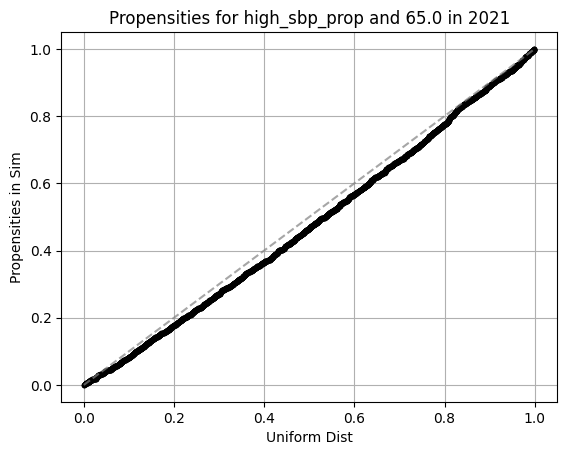

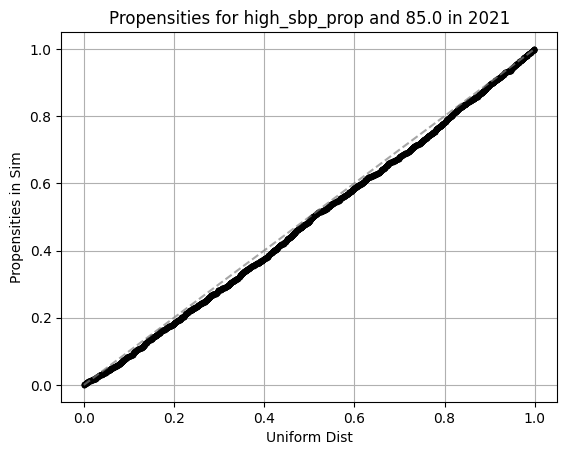

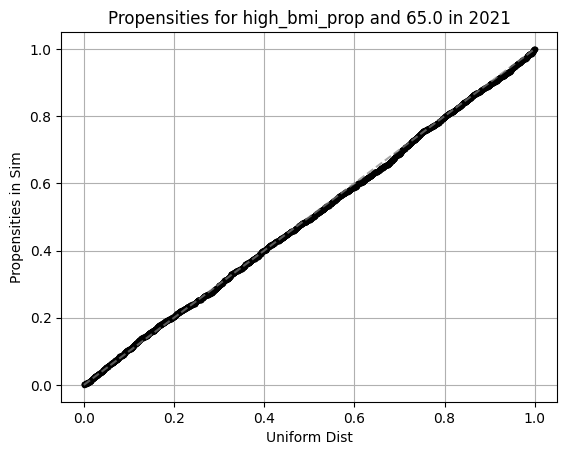

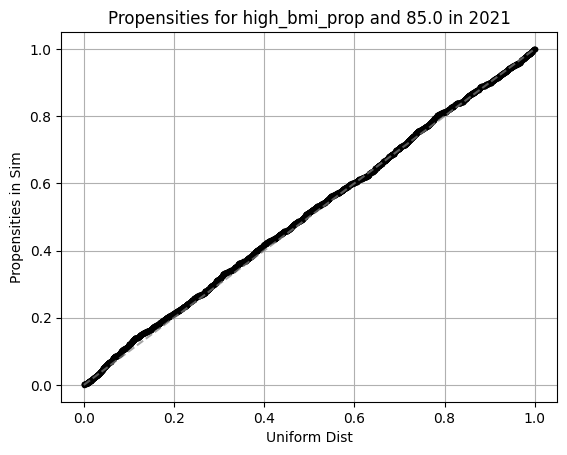

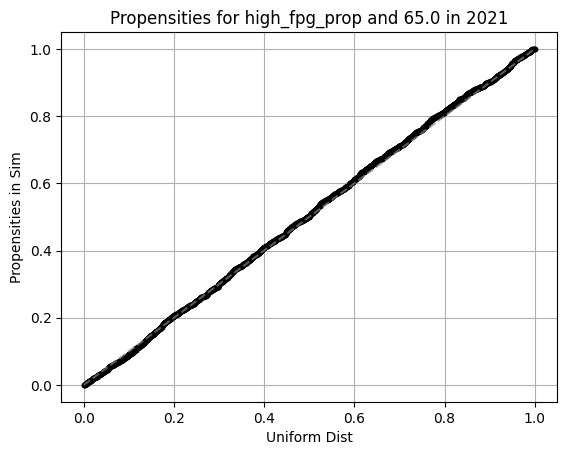

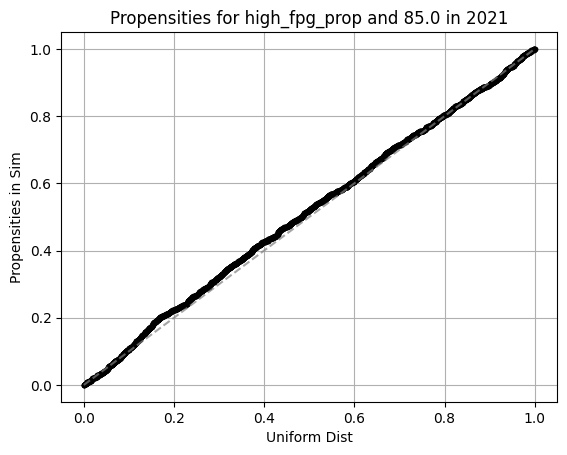

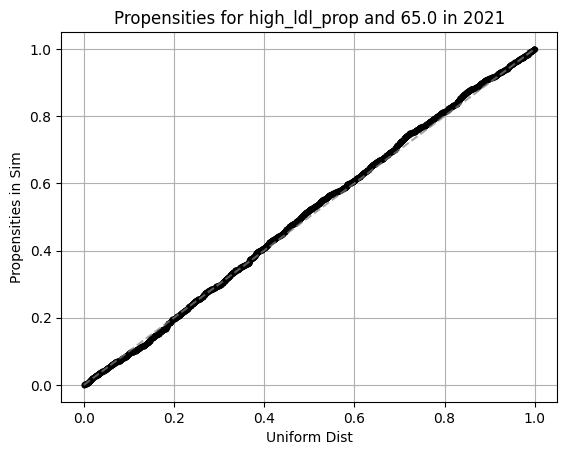

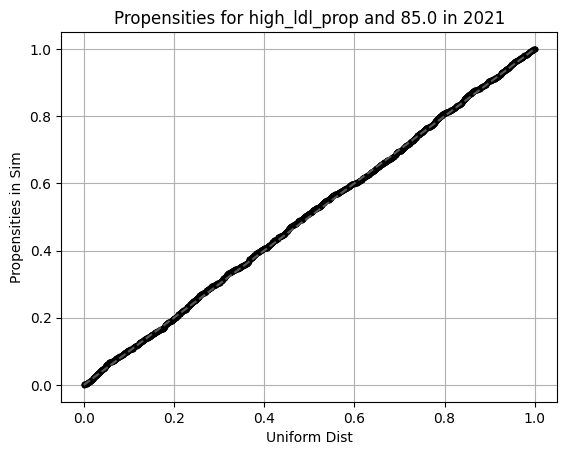

In [12]:
for risk in risks:
    for age in data1_small.age_start.unique():
        plt.figure()
        plt.plot(np.sort(np.random.uniform(size=len(data1_small))),
         data1_small[risk].sort_values(), 'k.')
        plt.plot([0,1], [0,1], '--', color='grey', alpha=.7)
        plt.grid()
        plt.xlabel('Uniform Dist')
        plt.ylabel('Propensities in Sim');
        plt.title(f'Propensities for {risk} and {age} in 2021')

In [13]:
sim_data = pd.DataFrame()
for step in list(range(0,25)):
    sim.step()
    pop_t = sim.get_population()
    data_t = pd.concat([pop_t, 
                   sim.get_value('high_ldl_cholesterol.exposure')(pop0.index).rename('high_ldl'),
                   sim.get_value('high_systolic_blood_pressure.exposure')(pop0.index).rename('high_sbp'),
                   sim.get_value('high_body_mass_index_in_adults.exposure')(pop0.index).rename('high_bmi'),
                   sim.get_value('high_fasting_plasma_glucose.exposure')(pop0.index).rename('high_fpg'),
                   sim.get_value('high_ldl_cholesterol.propensity')(pop0.index).rename('high_ldl_prop'),
                   sim.get_value('high_systolic_blood_pressure.propensity')(pop0.index).rename('high_sbp_prop'),
                   sim.get_value('high_body_mass_index_in_adults.propensity')(pop0.index).rename('high_bmi_prop'),
                   sim.get_value('high_fasting_plasma_glucose.propensity')(pop0.index).rename('high_fpg_prop')],
                       axis=1)
    data_t['step'] = step
    sim_data = pd.concat([sim_data, data_t])

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/framework/state_machine.py:88: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid th

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  sub_tables = list(sub_tables)
/ihme/homes/lutzes/.conda/envs/cvd/lib/python3.8/site-packages/vivarium/interpolation.py:119: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warnin

In [ ]:
test_data = sim_data
test_data = test_data.loc[(test_data.age > 25) & (test_data.alive == 'alive')]
test_data['age_start'] = ((test_data.age/5).astype(int) * 5).astype(float)
test_data_small = test_data.loc[(test_data.step==24) & (test_data.sex=='Male')]
test_data_small = test_data_small.loc[(test_data_small.age_start == 85) | (test_data_small.age_start == 65)]
test_data_small

In [ ]:
for risk in risks:
    for age in test_data_small.age_start.unique():
        ##Need to add a subdata statement here 
        plt.figure()
        plt.plot(np.sort(np.random.uniform(size=len(test_data_small))),
         test_data_small[risk].sort_values(), 'k.')
        plt.plot([0,1], [0,1], '--', color='grey', alpha=.7)
        plt.grid()
        plt.xlabel('Uniform Dist')
        plt.ylabel('Propensities in Sim');
        plt.title(f'Propensities for {risk} and {age} for 2023')

In [ ]:
test_data_small.high_sbp.mean()

## Abie Testing

## Testing Exposure Compared to Artifact in 2021

In [10]:
from vivarium import Artifact

#explore the artifact data (note age groups)
art = Artifact('/mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/alabama.hdf', filter_terms=['year_start == 2019', 'age_start >=  25'])

In [11]:
def load_artifact_data(word:str, cause:str, measure:str):
    master_art_data = pd.DataFrame()
    for i in ['alabama']: #in case there are other countries
        
        # grab main artifact object
        art = Artifact('/mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/' + i + '.hdf', 
                   filter_terms=['year_start == 2019', 'age_start >=  25']) # << MIGHT WANT TO CHANGE THESE TERMS
        
        # load requested measure
        data = art.load(word + '.' + cause + '.' + measure)
        
        # collapse to desired percentiles
        ## Add in the line for draw_0 here 
        data = data.apply(pd.DataFrame.describe, percentiles=[0.025, 0.35,0.975], axis=1).filter(['mean','35%', '2.5%', '97.5%']).reset_index()
        
        # formatting (may want to format age as well)
        data['location'] = i.capitalize()
        data['measure'] = measure
    
   
        master_art_data = master_art_data.append(data)
        
    return master_art_data

### SBP

In [12]:
sbp_art = load_artifact_data('risk_factor', 'high_systolic_blood_pressure', 'exposure')
sbp_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(sbp_art.age_start,sbp_art.age_end)]
sbp_art.head()

/tmp/ipykernel_4186310/240823744.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  master_art_data = master_art_data.append(data)


,sex,age_start,age_end,year_start,year_end,parameter,mean,35%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,110.635893,110.098339,107.945700,113.550750,Alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,112.876275,112.329861,110.098198,115.523727,Alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,116.139886,115.590512,113.594023,118.770064,Alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,118.491616,117.983562,115.903577,121.039457,Alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,121.645391,121.090394,118.875235,124.529834,Alabama,exposure,45_to_49


In [13]:
sbp_exp = (data1
                .groupby(['age_start', 'sex'])
                .high_sbp.describe(percentiles=[.025, .975])
                .filter(['mean','2.5%','97.5%'])
                .reset_index())
sbp_exp = sbp_exp.loc[sbp_exp.age_start < 105]
sbp_exp.head()

,age_start,sex,mean,2.5%,97.5%
0,25.0,Female,109.494786,93.223118,132.555900
1,25.0,Male,114.935349,98.391978,139.106575
2,30.0,Female,114.310311,96.728590,140.355667
3,30.0,Male,120.609564,102.385377,146.846728
4,35.0,Female,115.509044,94.389833,144.361854


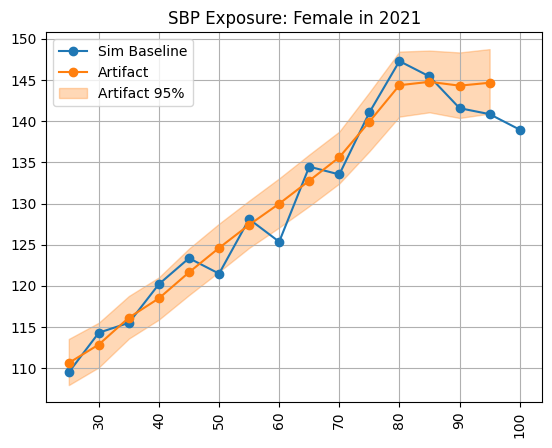

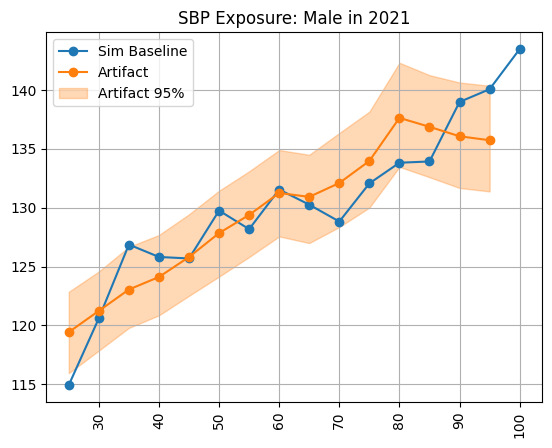

In [23]:
for sex in sbp_exp.sex.unique():
    plt.figure() 
    subdata = sbp_exp.loc[(sbp_exp.sex==sex)]
    plt.plot(subdata['age_start'], subdata['mean'], marker='o', color = 'C0', label = 'Sim Baseline')
    #plt.fill_between(subdata['age_start'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = sbp_art.loc[(sbp_art.sex==sex) & (sbp_art.year_end==2020)]
    plt.plot(subdata2['age_start'], subdata2['mean'], marker='o', label = 'Artifact', color = 'C1')
    plt.fill_between(subdata2['age_start'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3, label = 'Artifact 95%', color = 'C1')
    plt.title(f'SBP Exposure: {sex} in 2021') 
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend()

In [18]:
data1.loc[data1.age_start > 100]

,tracked,age,sex,alive,entrance_time,exit_time,location,cause_of_death,years_of_life_lost,years_lived_with_disability,...,scheduled_date,visit_type,high_ldl,high_sbp,high_bmi,high_fpg,hf_ihd,hf_resid,acute_mi,age_start
4700,True,106.524522,Female,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,3.328884,187.779511,23.861687,6.119356,0.005735,0.004658,0.002334,105.0
6575,True,108.032306,Male,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,2021-02-14 12:33:06.970780800,none,2.808106,137.643584,31.466309,8.347287,0.013222,0.008608,0.007617,105.0


Looks like the ends of the graph is just due to there being only one person in those groups! I removed them for clarity

### LDL-C

In [16]:
ldl_art_all = art.load('risk_factor.high_ldl_cholesterol.exposure')
ldl_art_all = ldl_art_all.loc[ldl_art_all.index.get_level_values('age_start') > 70]
ldl_small = ldl_art_all.apply(pd.DataFrame.describe, percentiles=[0.65], axis=1).filter(['65%']).reset_index()
ldl_small.mean()

/tmp/ipykernel_4186310/2109636798.py:4: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  ldl_small.mean()


age_start       85.000000
age_end         95.000000
year_start    2019.000000
year_end      2020.000000
65%              2.910916
dtype: float64

In [17]:
ldl_art = load_artifact_data('risk_factor', 'high_ldl_cholesterol', 'exposure')
ldl_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(ldl_art.age_start,ldl_art.age_end)]
ldl_art.head()

/tmp/ipykernel_4186310/240823744.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  master_art_data = master_art_data.append(data)


,sex,age_start,age_end,year_start,year_end,parameter,mean,35%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,2.639862,2.600945,2.472574,2.821188,Alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,2.724353,2.691550,2.553736,2.905134,Alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,2.802925,2.772667,2.639513,2.972487,Alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,2.880791,2.850118,2.721814,3.039119,Alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,2.998297,2.963904,2.837974,3.175367,Alabama,exposure,45_to_49


In [18]:
ldl_exp = (data1
                .groupby(['age_start', 'sex'])
                .high_ldl.describe(percentiles=[.025, 0.35,.975])
                .filter(['mean','35%','2.5%','97.5%'])
                .reset_index())
ldl_exp.head()

,age_start,sex,mean,35%,2.5%,97.5%
0,25.0,Female,2.621558,2.199689,1.170534,4.586028
1,25.0,Male,2.894775,2.491154,1.232159,4.923026
2,30.0,Female,2.725320,2.365144,1.243026,4.450896
3,30.0,Male,2.899488,2.536456,1.335136,4.741885
4,35.0,Female,2.836356,2.450746,1.374390,4.674024


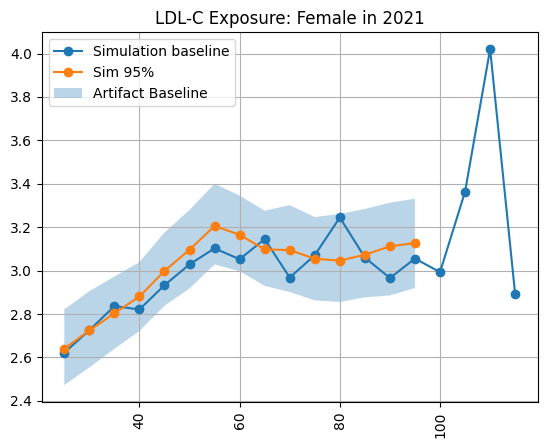

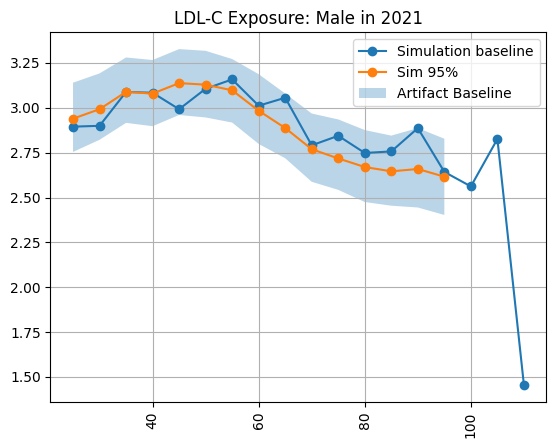

In [19]:
for sex in ldl_exp.sex.unique():
    plt.figure() 
    subdata = ldl_exp.loc[(ldl_exp.sex==sex)]
    plt.plot(subdata['age_start'], subdata['mean'], marker='o')
    #plt.fill_between(subdata['age_start'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = ldl_art.loc[(ldl_art.sex==sex) & (ldl_art.year_end==2020)]
    plt.plot(subdata2['age_start'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_start'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'LDL-C Exposure: {sex} in 2021') 
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 

In [22]:
data1.loc[data1.age_start == 100]

,tracked,age,sex,alive,entrance_time,exit_time,location,cause_of_death,years_of_life_lost,years_lived_with_disability,...,scheduled_date,visit_type,high_ldl,high_sbp,high_bmi,high_fpg,hf_ihd,hf_resid,acute_mi,age_start
2108,True,101.601737,Female,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,1.806020,194.654956,28.820533,5.647478,0.006498,0.005278,0.002028,100.0
2285,True,104.867639,Female,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,3.409409,131.617414,25.428487,9.634173,0.005316,0.004318,0.001913,100.0
4871,True,104.731512,Male,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,2.022770,134.074676,30.117374,8.114999,0.012780,0.008320,0.005216,100.0
7436,True,100.593125,Male,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,4.106867,129.441540,30.292312,6.212580,0.010671,0.006947,0.004901,100.0
7744,True,100.136283,Female,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,2.881371,138.752634,20.549861,4.270128,0.004938,0.004010,0.000552,100.0
8042,True,104.439608,Female,alive,2020-12-04,NaT,Alabama,not_dead,0.0,0.0,...,NaT,none,1.577250,138.738971,19.741234,5.641705,0.004938,0.004010,0.000462,100.0


Again, the issues at the end of the graph look like they are due to small samples

## BMI too

In [19]:
bmi_art = load_artifact_data('risk_factor', 'high_body_mass_index_in_adults', 'exposure')
bmi_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(bmi_art.age_start,bmi_art.age_end)]
bmi_art.head()

/tmp/ipykernel_32641/240823744.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  master_art_data = master_art_data.append(data)


,sex,age_start,age_end,year_start,year_end,parameter,mean,35%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,30.899912,30.834806,30.572156,31.233780,Alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,31.636913,31.572002,31.293987,31.989474,Alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,31.883495,31.819942,31.555235,32.210906,Alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,32.130649,32.065292,31.801051,32.462829,Alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,32.169931,32.101729,31.855765,32.505542,Alabama,exposure,45_to_49


In [21]:
bmi_exp = (data1
                .groupby(['age_start', 'sex'])
                .high_bmi.describe(percentiles=[.025, .975])
                .filter(['mean','2.5%','97.5%'])
                .reset_index())
bmi_exp = bmi_exp.loc[bmi_exp.age_start < 105]
bmi_exp.head()

,age_start,sex,mean,2.5%,97.5%
0,25.0,Female,30.429599,15.748353,50.808651
1,25.0,Male,29.119499,17.145312,47.206215
2,30.0,Female,31.624292,17.902438,53.565990
3,30.0,Male,30.305817,19.311306,46.005232
4,35.0,Female,31.437472,16.492798,52.796450


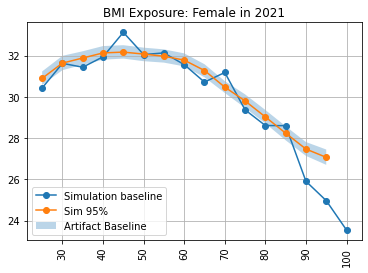

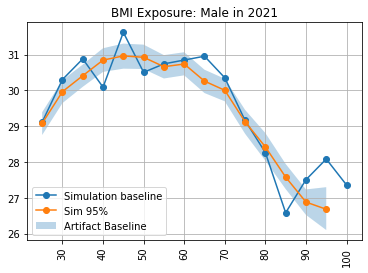

In [22]:
for sex in bmi_exp.sex.unique():
    plt.figure() 
    subdata = bmi_exp.loc[(bmi_exp.sex==sex)]
    plt.plot(subdata['age_start'], subdata['mean'], marker='o')
    #plt.fill_between(subdata['age_start'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = bmi_art.loc[(bmi_art.sex==sex) & (bmi_art.year_end==2020)]
    plt.plot(subdata2['age_start'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_start'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'BMI Exposure: {sex} in 2021') 
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 